## FAFB14 mirror landmarks
In this notebook, we will generate a "shortcut" to mirror FAFB14 data. The general idea is:
1. Evenly sample points from one side of the brain
2. Flip them to the other side to generate mirror-symmetrical source landmarks
3. Mirror those landmarks again but going via JRC2018F to generate the target landmarks

In [24]:
import numpy as np
import pandas as pd

import flybrains
import navis

In [3]:
np.array(flybrains.FAFB14.boundingbox).reshape(3, 2)

array([[192200, 853686],
       [ 75853, 398832],
       [  2007, 271205]])

In [4]:
center = 192200 + (853686 - 192200) / 2
center

522943.0

In [29]:
# Sample points within the volume
sample = np.mgrid[192200:853686:20000, 75853:398832:20000, 2007:271205:20000].reshape(3,-1).T   

# Drop pointns outside the volume
sample = sample[navis.in_volume(sample, flybrains.FAFB14.mesh)]

In [30]:
# The properly mirrored coordinates
sample_mirr = navis.mirror_brain(sample, template='FAFB14', via='JRC2018F')

Transform path: FAFB14->FAFB14um->JRC2018F
Transform path: JRC2018F->FAFB14um->FAFB14


In [31]:
# Just flipped
sample_flip = navis.mirror_brain(sample, template='FAFB14', warp=False)

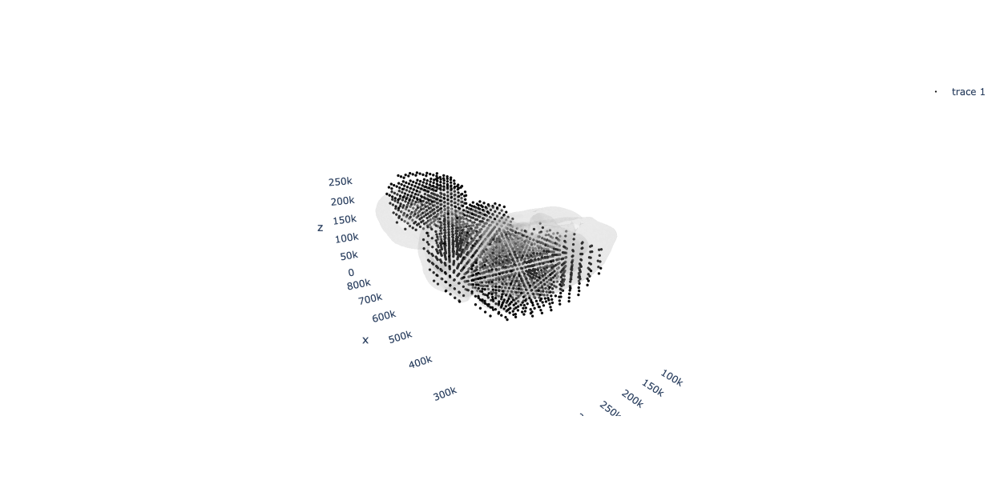

In [33]:
navis.plot3d([flybrains.FAFB14, sample_flip])

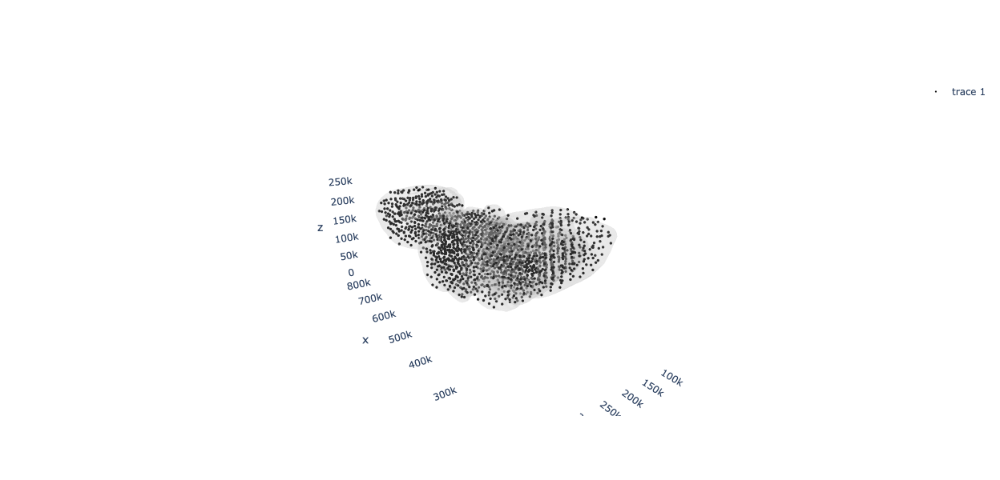

In [32]:
navis.plot3d([flybrains.FAFB14, sample_mirr])

In [34]:
# Bring it together
source = pd.DataFrame(sample_flip, columns=['x_flip', 'y_flip', 'z_flip']).round().astype(int)
target = pd.DataFrame(sample_mirr, columns=['x_mirr', 'y_mirr', 'z_mirr']).round().astype(int)
lm = pd.concat((source, target), axis=1)
lm.head()

,x_flip,y_flip,z_flip,x_mirr,y_mirr,z_mirr
0,833686,195853,222007,839935,222614,177749
1,833686,195853,242007,844633,221697,197447
2,833686,215853,202007,832953,242508,158898
3,833686,215853,222007,837203,241625,176563
4,833686,215853,242007,843697,240882,199622


In [35]:
lm.to_csv('FAFB14_mirror_landmarks.csv', index=False)